In [1]:
import glob

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline

from pylab import rcParams

from utils import METRICS, CONT_PARAMETERS, LOG_PARAMETERS, SET_PARAMETERS, INT_PARAMETERS, read_files,\
    top_mean_dev_auc, top_mean_validation_auc, rolling_min_dev_auc, top_min_whole_validation_auc,\
    top_min_dev_auc, top_min_validation_auc, read_files

In [2]:
rcParams['figure.figsize'] = 20, 5
pd.set_option('display.max_columns', None)

In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
files = ['./experiments/bagging-switch-1.pkl',
         './experiments/bagging-switch-2.pkl',
        './experiments/bagging-switch-3.pkl']

In [5]:
best_mean_dev = top_mean_dev_auc(read_files(files), 50000)
best_mean_dev.groupby(['file', 'experiment_id']).ngroups

128

In [6]:
best_min_dev = top_min_dev_auc(read_files(files), 50000)
best_min_dev.groupby(['file', 'experiment_id']).ngroups

146

In [7]:
true_best = top_min_whole_validation_auc(read_files(files), 50000)
true_best.groupby(['file', 'experiment_id']).ngroups

136

In [9]:
compare_columns = ['mean_dev_auc', 'mean_validation_auc',
               'mean_whole_validation_auc', 'min_dev_auc', 'min_validation_auc', 'min_whole_validation_auc']

In [10]:
best_mean_dev[compare_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
mean_dev_auc,50000.0,0.813768,0.007497,0.806066,0.807581,0.810012,0.819566,0.832576
mean_validation_auc,50000.0,0.794814,0.006500,0.778703,0.790256,0.792557,0.801029,0.810141
mean_whole_validation_auc,50000.0,0.797116,0.007395,0.756487,0.791475,0.795641,0.804044,0.811073
min_dev_auc,50000.0,0.797997,0.012820,0.749130,0.793824,0.796994,0.807039,0.823508
min_validation_auc,50000.0,0.787299,0.015510,0.720940,0.785117,0.789380,0.797472,0.808920
min_whole_validation_auc,50000.0,0.795449,0.008849,0.714739,0.790139,0.794585,0.802883,0.810748


In [11]:
best_mean_dev.min_whole_validation_auc.corr(best_mean_dev.mean_dev_auc, method='spearman')

0.6538862550794079

In [12]:
best_min_dev[compare_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
mean_dev_auc,50000.0,0.812697,0.008185,0.800819,0.806838,0.808477,0.819299,0.832576
mean_validation_auc,50000.0,0.793829,0.007411,0.777324,0.788053,0.791905,0.801029,0.810141
mean_whole_validation_auc,50000.0,0.794129,0.009565,0.735115,0.788891,0.793139,0.801064,0.811073
min_dev_auc,50000.0,0.800971,0.007836,0.793056,0.794957,0.797059,0.807039,0.823508
min_validation_auc,50000.0,0.790766,0.007921,0.767803,0.785001,0.789127,0.797472,0.808920
min_whole_validation_auc,50000.0,0.792562,0.011022,0.714739,0.787826,0.792234,0.799455,0.810748


In [13]:
best_min_dev.min_whole_validation_auc.corr(best_min_dev.min_dev_auc, method='spearman')

0.7636194390141274

In [14]:
true_best[compare_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
mean_dev_auc,50000.0,0.805374,0.023196,0.643583,0.798743,0.808155,0.819053,0.832576
mean_validation_auc,50000.0,0.786271,0.021780,0.633138,0.778313,0.791360,0.800875,0.810141
mean_whole_validation_auc,50000.0,0.802194,0.004332,0.792680,0.798799,0.802966,0.805587,0.811073
min_dev_auc,50000.0,0.760416,0.070272,0.500000,0.740477,0.788005,0.807039,0.823508
min_validation_auc,50000.0,0.748274,0.068800,0.500000,0.719419,0.780439,0.797472,0.808920
min_whole_validation_auc,50000.0,0.801054,0.004532,0.792631,0.797472,0.801861,0.804813,0.810748


In [17]:
best_mean_dev.merge(true_best, on=['file', 'experiment_id', 'iteration'])\
    .groupby(['file', 'experiment_id']).ngroups

89

In [18]:
best_mean_dev.merge(true_best, on=['file', 'experiment_id', 'iteration']).shape

(28898, 105)

In [21]:
best_min_dev.merge(true_best, on=['file', 'experiment_id', 'iteration'])\
    .groupby(['file', 'experiment_id']).ngroups

72

In [22]:
best_min_dev.merge(true_best, on=['file', 'experiment_id', 'iteration']).shape

(23508, 105)

In [25]:
best = best_mean_dev

In [26]:
best.shape

(50000, 54)

In [27]:
best.groupby(SET_PARAMETERS).min_whole_validation_auc.describe()

count      mean       std  \
param_is_unbalance param_boost_from_average                                
False              False                     10624.0  0.794352  0.006907   
                   True                      10611.0  0.795330  0.007823   
True               False                     15865.0  0.796877  0.007295   
                   True                      12900.0  0.794693  0.012016   

                                                  min       25%       50%  \
param_is_unbalance param_boost_from_average                                 
False              False                     0.767453  0.789351  0.793185   
                   True                      0.714739  0.790090  0.794500   
True               False                     0.743611  0.791758  0.796502   
                   True                      0.748383  0.789598  0.793008   

                                                  75%       max  
param_is_unbalance param_boost_from_average                      
False              False                     0.800005  0.808732  
                   True                      0.801730  0.809303  
True               False                     0.803055  0.810748  
                   True                      0.805131  0.808362

In [28]:
best.groupby(SET_PARAMETERS + ['file', 'experiment_id']).size().groupby(SET_PARAMETERS).size()

param_is_unbalance  param_boost_from_average
False               False                       26
                    True                        26
True                False                       42
                    True                        34
dtype: int64

In [29]:
best['param_bagging_enable'] = (best.param_bagging_freq != 0)

best.groupby('param_bagging_enable').size()

param_bagging_enable
False    34999
True     15001
dtype: int64

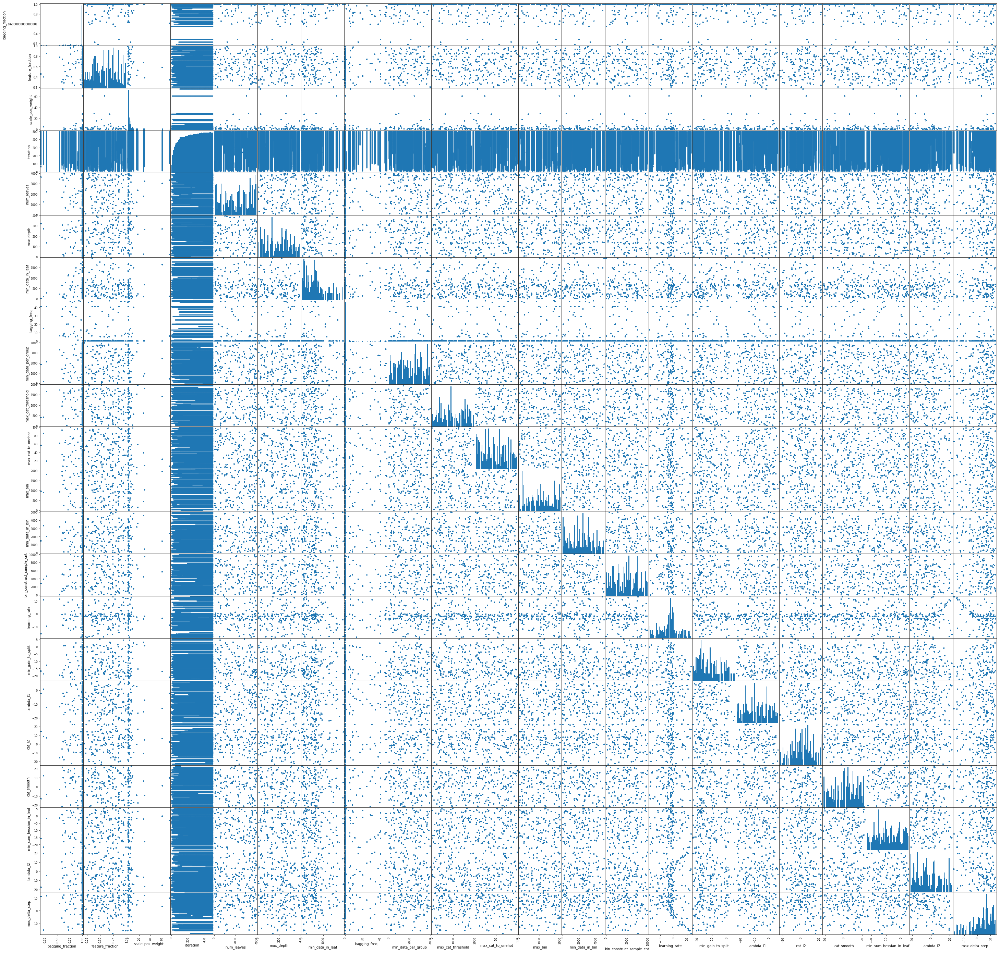

In [30]:
pd.plotting.scatter_matrix(
    pd.concat([best[CONT_PARAMETERS + INT_PARAMETERS], 
               np.log(best[list(set(LOG_PARAMETERS))])],
              axis='columns',
              sort=True
             ).rename(lambda x: x.replace('param_', ''), axis='columns'),
    alpha=0.5, figsize=(50, 50), hist_kwds={'bins': 50});

### check failures in best selected parameter range

In [31]:
best_range = best\
    [[c for c in best.columns if c.startswith('param_') and not c in SET_PARAMETERS]]\
    .drop(columns=['param_seed', 'param_bagging_enable'])\
    .quantile([0, 1]).T
best_range

,0.0,1.0
param_bagging_fraction,1.699536e-01,1.000000e+00
param_bagging_freq,0.000000e+00,4.800000e+01
param_bin_construct_sample_cnt,2.600000e+01,9.946000e+03
param_cat_l2,1.066554e-10,9.451767e+09
param_cat_smooth,4.298331e-10,7.272514e+09
param_feature_fraction,2.038080e-01,9.831188e-01
param_lambda_l1,1.178131e-10,5.508547e+02
param_lambda_l2,3.905913e-10,4.799788e+09
param_learning_rate,1.465391e-08,5.327481e+05
param_max_bin,1.000000e+01,2.037000e+03


In [32]:
dfs = []
for f in files:
    df = pd.read_pickle(f).assign(file=f)
    for (n, l, h) in best_range.itertuples():
        df = df[(((df[n] >= l) & (df[n] <= h))
                 | df[n].isna())].copy()
    dfs.append(df)

limited = pd.concat(dfs, ignore_index=True, sort=True)
del dfs
limited.shape

(1372000, 54)

In [33]:
limited_best_iteration = limited.sort_values('min_whole_validation_auc').groupby(['file', 'experiment_id']).last()
limited_best_iteration.shape

(2744, 52)

In [34]:
limited_best_iteration['param_bagging_enable'] = (limited_best_iteration.param_bagging_freq != 0)

In [35]:
limited_best_iteration.min_whole_validation_auc.describe()

count    2744.000000
mean        0.611307
std         0.116144
min         0.493961
25%         0.500000
50%         0.589794
75%         0.729619
max         0.810748
Name: min_whole_validation_auc, dtype: float64

In [36]:
limited_bad = limited_best_iteration[limited_best_iteration.min_whole_validation_auc < 0.6]

In [37]:
limited_bad.shape

(1392, 53)

TODO pikachu with bruises reaction

In [38]:
limited_bad.groupby(SET_PARAMETERS).size()

param_is_unbalance  param_boost_from_average
False               False                       367
                    True                        394
True                False                       241
                    True                        390
dtype: int64

In [39]:
limited_bad.groupby('param_bagging_enable').size()

param_bagging_enable
False    608
True     784
dtype: int64

In [40]:
limited_best_iteration.groupby(SET_PARAMETERS).min_whole_validation_auc.describe()

count      mean       std  \
param_is_unbalance param_boost_from_average                              
False              False                     614.0  0.592056  0.112804   
                   True                      647.0  0.588757  0.112485   
True               False                     768.0  0.658981  0.112602   
                   True                      715.0  0.597036  0.111361   

                                                  min  25%       50%  \
param_is_unbalance param_boost_from_average                            
False              False                     0.493961  0.5  0.500000   
                   True                      0.500000  0.5  0.500000   
True               False                     0.493961  0.5  0.704197   
                   True                      0.500000  0.5  0.500000   

                                                  75%       max  
param_is_unbalance param_boost_from_average                      
False              False                     0.710789  0.809088  
                   True                      0.702412  0.809303  
True               False                     0.751872  0.810748  
                   True                      0.690235  0.808386

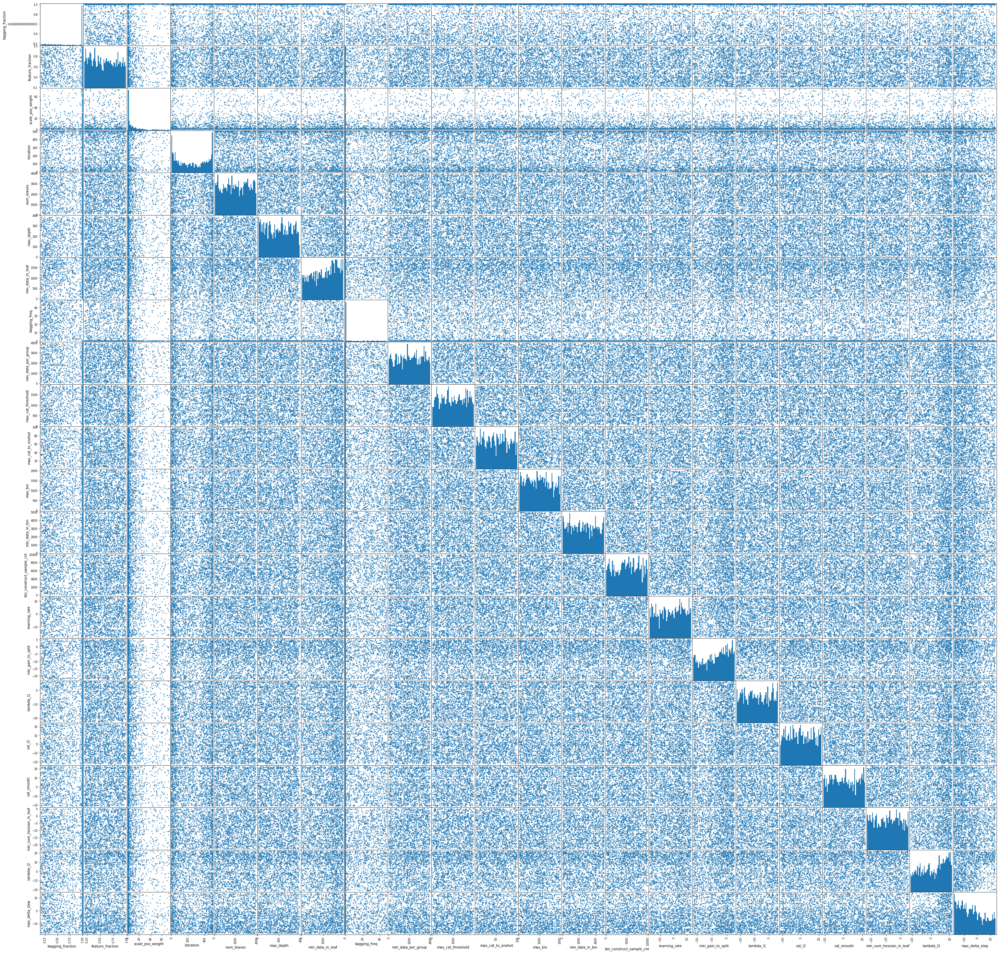

In [41]:
pd.plotting.scatter_matrix(
    pd.concat([limited_bad[CONT_PARAMETERS + INT_PARAMETERS], 
               np.log(limited_bad[list(set(LOG_PARAMETERS))])],
              axis='columns',
              sort=True
             ).rename(lambda x: x.replace('param_', ''), axis='columns'),
    alpha=0.8, figsize=(50, 50), hist_kwds={'bins': 50});

### single best parameter set

In [42]:
single_best = best.iloc[0]

In [43]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(single_best)

experiment_id                                                          621
file                                    ./experiments/bagging-switch-1.pkl
iteration                                                              500
max_dev_auc                                                       0.857244
max_dev_binary_logloss                                            0.524493
max_validation_auc                                                0.810445
max_validation_binary_logloss                                      0.54122
max_whole_train_auc                                               0.836952
max_whole_train_binary_logloss                                    0.503577
max_whole_validation_auc                                          0.809418
max_whole_validation_binary_logloss                               0.537791
mean_dev_auc                                                      0.832576
mean_dev_binary_logloss                                           0.508894
mean_train_auc           

In [44]:
# todo generate 1% neighborhood around best parameter set

In [45]:
second_best = best.iloc[1]

In [46]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(second_best)

experiment_id                                                          621
file                                    ./experiments/bagging-switch-1.pkl
iteration                                                              499
max_dev_auc                                                       0.857179
max_dev_binary_logloss                                            0.524483
max_validation_auc                                                0.810481
max_validation_binary_logloss                                     0.541211
max_whole_train_auc                                               0.836941
max_whole_train_binary_logloss                                    0.503603
max_whole_validation_auc                                          0.809376
max_whole_validation_binary_logloss                               0.537794
mean_dev_auc                                                       0.83255
mean_dev_binary_logloss                                           0.508917
mean_train_auc           